In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import os
import pickle
from scipy.optimize import minimize, root, curve_fit
from scipy.special import lambertw

In [3]:
from Spherical_integrals_e import *
import routines
from known_formulas import *

In [4]:
#Fit previous curve with exponential function
def linear(x, a,b):
    return a * x + b

### Annealed vs RS

In [ ]:
p = 4

In [44]:
def Td_calc(p):
    return sqrt(p*(p-2)**(p-2) /(2 * (p-1)**(p-1)))

In [45]:
n_points_m = 1_000
n_points_T = 4
n_points_more_T = 1

T_kauz, T_dyn = Td_calc(p) - 0.05, Td_calc(p)

Teqs = np.hstack((np.linspace(T_kauz, T_dyn, n_points_T), T_dyn + (T_dyn - T_kauz) / (n_points_T) * np.arange(1, n_points_more_T + 1)))

es = - 1 / (2 * Teqs)

In [46]:
file_path = f'./dataSph/rs_p{p:d}.pkl'
if False: #os.path.exists(file_path):
    print("Data is already saved.")

    with open(file_path, 'rb') as f:
        tmp = pickle.load(f)
        data = tmp['data']
        ms = tmp['ms']

    print("Data is loaded.")
else:
    print("Data is not saved.")

    ms = np.linspace(0.0, 0.96, n_points_m)
    data = routines.observables((len(Teqs), n_points_m))
    q_old = 0.8

    for jdx, e in enumerate(tqdm(es, desc='RS')):
        for idx, m in enumerate(ms):
            q = fixed_points_q(m, e, p, q_init=q_old)

            data['q'][jdx, idx] = q
            #data['h'][jdx, idx] = h
            data['T'][jdx, idx] = 1 / beta_q_e(q, m, e, p)
            #data['delta_f'][jdx, idx] = deltaf_FP(m, q, h, p, e)
            data['s'][jdx, idx] = s_FP(q, m, p, e)
            #data['dAT'][jdx, idx] = dAT_condition(
            #    q, m, h, beta_q_e(q, m, e, p,h), beta_q_e(q, m, e, p,h) / 2, p
            #)
            q_old = q

    with open(f'./dataSph/rs_p{p:d}.pkl', 'wb') as f:
        pickle.dump({'data': data, 'ms': ms}, f)

    print("Data is saved.")

Data is not saved.


RS:   0%|          | 0/5 [00:00<?, ?it/s]

Data is saved.


In [47]:
s_anneald = np.empty((len(Teqs), len(ms)))
for jdx, e in enumerate(tqdm(es, desc="Annealed")):
    for idx, m in enumerate(ms):
        s_anneald[jdx, idx] = annealed_entropy(m, e, p)

Annealed:   0%|          | 0/5 [00:00<?, ?it/s]

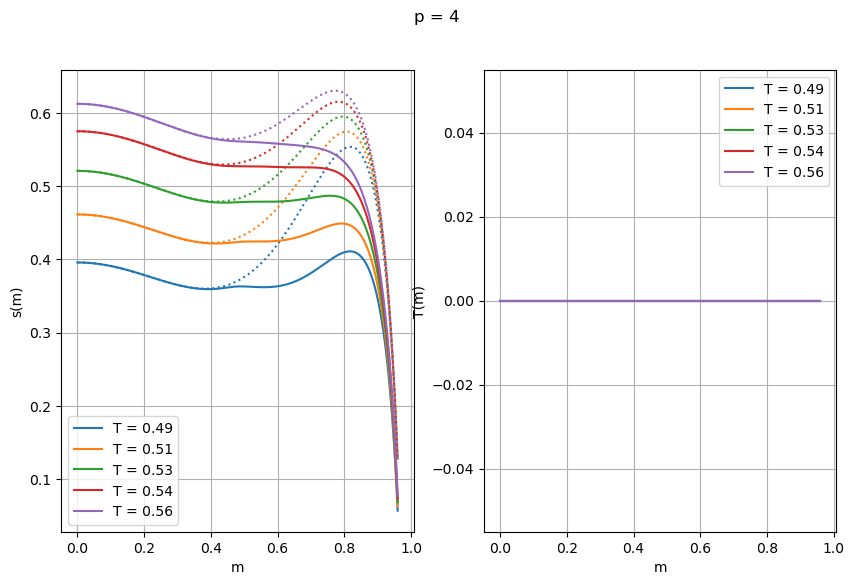

In [48]:
plt.figure(figsize=(10,6))
plt.suptitle(f"p = {p:d}")
for i, e in enumerate(es):
    # legend_name = legend_name_Tk_Td(e, T_kauz, T_dyn)
    legend_name = f'T = {Teqs[i]:.2f}'

    #plt.plot(ms, s_anneald[i], ':', color=f'C{i}')
    plt.subplot(1, 2, 1)
    plt.plot(ms, data['s'][i], label=legend_name, color=f'C{i}')
    plt.plot(ms, s_anneald[i], ':', color=f'C{i}')

    plt.subplot(1, 2, 2)
    plt.plot(ms, data['h'][i], label=legend_name, color=f'C{i}')


plt.subplot(1, 2, 1)
plt.xlabel('m')
plt.ylabel(r's(m)')
plt.legend()
plt.grid()
# plt.yscale('log')
# plt.ylim(0.1,1)

plt.subplot(1, 2, 2)
# plt.axhline(y=T_kauz, color='k', linestyle='--', label=r'$T_{\rm Kauz}$')
# plt.axhline(y=T_dyn, color='k', linestyle=':', label=r'$T_{\rm dyn}$')
plt.xlabel('m')
plt.ylabel(r'T(m)')
plt.legend()
plt.grid()

# plt.tight_layout()
#plt.savefig(
#    f"./imgs/imgs_Sph/annealed_vs_RS_p{p:d}.png",
#    bbox_extra_artists=(lgd,),
#    bbox_inches="tight",
#    dpi=360,
#)

### State Following

In [5]:
def Td_calc(p):
    #return sqrt(p*(p-2)**(p-2) /(2 * (p-1)**(p-1)))
    return np.exp(0.5*(np.log(p) + (p-2)*np.log(p-2) - (p-1)*np.log(p-1) - np.log(2)))

def Ts_calc(p):
    #y = minimize(lambda x: 2 / p + 2 * x * (1 - x + np.log(x)) / ((1 - x) ** 2), 0.5).x[0]
    y = root(lambda x: 2 / p + 2 * x * (1 - x + np.log(x)) / ((1 - x) ** 2), 1e-9).x[0]
    #print("y = ", y)
    return y * (1 - y) ** (0.5 * p - 1) * np.sqrt( p / (2 * y))

## p=3

In [7]:
p=3

In [8]:
n_points_m = 1_000
n_points_less_T = 10
n_points_T = 10
n_points_more_T = 41

T_kauz, T_dyn = Ts_calc(p), Td_calc(p)

Teqs = np.hstack(((T_kauz - (T_dyn - T_kauz) / (n_points_T) * np.arange(1, n_points_less_T + 1))[ : :-1],np.linspace(T_kauz, T_dyn, n_points_T+1), T_dyn + (T_dyn - T_kauz) / (n_points_T) * np.arange(1, n_points_more_T + 1)))
#Teqs = [T_kauz, 0.5*(T_dyn + T_kauz), T_dyn, 2*T_dyn, 4*T_dyn]
Tdiff = (T_dyn - T_kauz)
#Teqs = np.linspace(T_dyn, T_dyn + 10*Tdiff, 10)
J0 = 0.5 / T_kauz
#es = - 1 / (2 * Teqs)

m2i = 0.5
q2i = 0.5

In [9]:
file_path = f'./dataSphJ0/rs_p{p:d}.pkl'
if False: #os.path.exists(file_path):
    print("Data is already saved.")

    with open(file_path, 'rb') as f:
        tmp = pickle.load(f)
        data = tmp['data']
        ms = tmp['ms']

    print("Data is loaded.")
else:
    print("Data is not saved.")

    ms = np.linspace(0., 0.8, n_points_m)
    data = routines.observables((len(Teqs), n_points_m))
    q_old = 0.9

    m_2 = m2i
    q_2 = q2i
    blend=0.95

    mss = np.empty(len(Teqs))
    qss = np.empty(len(Teqs))
    fss = np.empty(len(Teqs))
    ess = np.empty(len(Teqs))
    sss = np.empty(len(Teqs))
    Hes = np.empty(len(Teqs))

    for jdx, T in enumerate(tqdm(Teqs, desc='RS')):
        for idx, m in enumerate(ms):
            q = fixed_points_q_J0(m, 1/T, p,blend = blend, q_init=q_old)

            data['q'][jdx, idx] = q
            #data['h'][jdx, idx] = h
            data['T'][jdx, idx] = T
            data['f'][jdx, idx] = f_FP_J0(q, m, p, 1/T, J0)
            data['s'][jdx, idx] = s_FP_J0(q, m, p, 1/T, J0)
            data['e'][jdx, idx] = e_J0(q, m, p, 1/T, J0)
            data['He'][jdx, idx] = Hes_eig_J0(q, m, p, 1/T, J0)
            #data['dAT'][jdx, idx] = dAT_condition(
            #    q, m, h, beta_q_e(q, m, e, p,h), beta_q_e(q, m, e, p,h) / 2, p
            #)
            q_old = q

        err = 1

        #m_2 = m2i
        #q_2 = q2i
        
        while err > 1e-7:
            m_new = compute_m_FP_J0(m_2, q_2, p, 1 / T, J0)
            q_new = compute_q_FP_J0(m_2, q_2, p, 1 / T)

            err = max(abs(q_new - q_2), abs(m_new - m_2))
            m_2 = blend * m_2 + (1 - blend) * m_new
            q_2 = blend * q_2 + (1 - blend) * q_new
            print(T, m_2, q_2, err)

        mss[jdx] = m_2
        qss[jdx] = q_2
        ess[jdx] = e_J0(q_2, m_2, p, 1/T, J0)
        fss[jdx] = f_FP_J0(q_2, m_2, p, 1/T, J0)
        sss[jdx] = s_FP_J0(q_2, m_2, p, 1/T, J0)
        Hes[jdx] = Hes_eig_J0(q_2, m_2, p, 1/T, J0)

    with open(f'./dataSphJ0/rs_p{p:d}.pkl', 'wb') as f:
        pickle.dump({'data': data, 'ms': ms}, f)

    print("Data is saved.")

Data is not saved.


RS:   0%|          | 0/62 [00:00<?, ?it/s]

/Users/matteovilucchio/Documents/GitHub/fixed-energy-slice/Spherical_integrals_e.py:126: RuntimeWarning: invalid value encountered in scalar divide
  -0.125*(4*m**4*q**2 + 4*beta*J0*m**p*(-1 + p)*p*(-1 + q)**3*q**2 -
/Users/matteovilucchio/Documents/GitHub/fixed-energy-slice/Spherical_integrals_e.py:126: RuntimeWarning: invalid value encountered in scalar divide
  -0.125*(4*m**4*q**2 + 4*beta*J0*m**p*(-1 + p)*p*(-1 + q)**3*q**2 -


0.5597355091389332 0.5035792484082695 0.5024615146662168 0.0715849681653894
0.5597355091389332 0.5072474497921649 0.5049788313582266 0.07336402767790628
0.5597355091389332 0.5110059446453559 0.5075534363502892 0.07516989706381993
0.5597355091389332 0.5148559504178476 0.5101868047893583 0.07700011544983487
0.5597355091389332 0.5187985418537836 0.5128803937082022 0.07885182871872076
0.5597355091389332 0.522834629517986 0.515635634163461 0.08072175328404696
0.5597355091389332 0.526964936423724 0.5184539224222947 0.08260613811475914
0.5597355091389332 0.5311899726845134 0.5213366101186369 0.08450072521578811
0.5597355091389332 0.5355100081270273 0.5242849932982594 0.08640070885027717
0.5597355091389332 0.5399250428211462 0.5273003002711208 0.08830069388237571
0.5597355091389332 0.5444347755075464 0.5303836781901313 0.09019465372800506
0.5597355091389332 0.5490385699338237 0.5335361782778681 0.09207588852554827
0.5597355091389332 0.5537354191478051 0.5367587396273265 0.09393698427962727
0.5

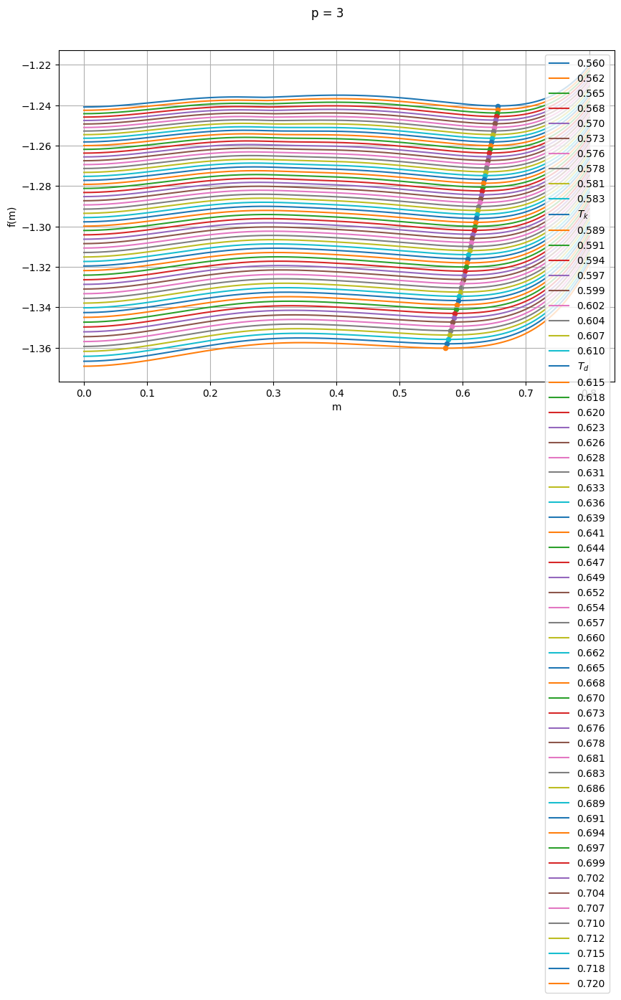

In [10]:
plt.figure(figsize=(10,6))
plt.suptitle(f"p = {p:d}")
for i, T in enumerate(Teqs):
    legend_name = routines.legend_name_Tk_Td_T(T, T_kauz, T_dyn)
    #legend_name = f'T = {Teqs[i]:.3f}'

    #plt.plot(ms, s_anneald[i], ':', color=f'C{i}')
    plt.plot(ms, data['f'][i], label=legend_name, color=f'C{i}')
    plt.scatter(mss[i], fss[i], c=f'C{i}', s=20)


plt.xlabel('m')
plt.ylabel(r'f(m)')
#plt.xlim(0, 0.8)
#plt.ylim(-1.4, -1.2)
plt.legend()
plt.grid()


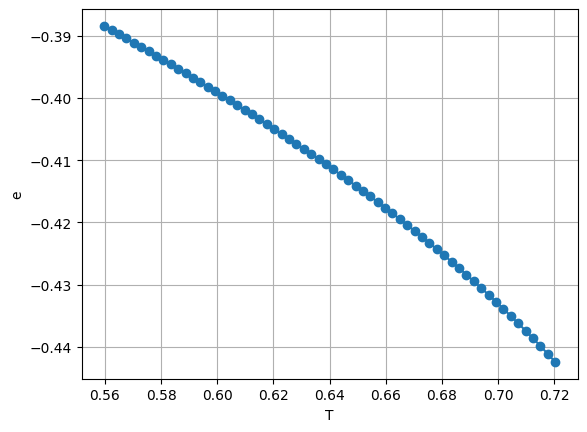

In [11]:
plt.plot(Teqs, ess, 'o-', label='FP')
plt.xlabel('T')
plt.ylabel('e')
plt.grid()

In [12]:
popt2, pcov2 = curve_fit(lambda x, a, b: a*x + b, Teqs, Hes)
popt2

array([-2.16813552,  1.77381964])

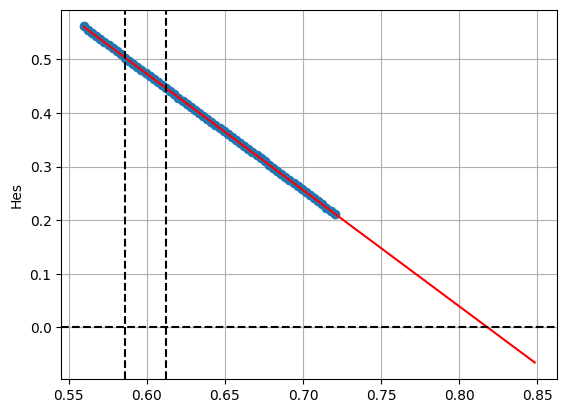

In [13]:
Tfit = np.linspace(Teqs[0], Teqs[-1] + 0.1* (Teqs[0] + Teqs[-1]), 100)
plt.plot(Teqs, Hes, 'o-', label='FP')
plt.plot(Tfit, linear(Tfit, *popt2), 'r-')
plt.axhline(y=0, color='k', linestyle='--')
plt.axvline(x=T_kauz, color='k', linestyle='--')
plt.axvline(x=T_dyn, color='k', linestyle='--')
plt.ylabel('Hes')
plt.grid()

## p=4

In [14]:
p=4

In [55]:
n_points_m = 1_000
n_points_less_T = 10
n_points_T = 10
n_points_more_T = 60

T_kauz, T_dyn = Ts_calc(p), Td_calc(p)

Teqs = np.hstack(((T_kauz - (T_dyn - T_kauz) / (n_points_T) * np.arange(1, n_points_less_T + 1))[ : :-1],np.linspace(T_kauz, T_dyn, n_points_T+1), T_dyn + (T_dyn - T_kauz) / (n_points_T) * np.arange(1, n_points_more_T + 1)))
# Teqs = T_kauz + 0.01 * np.arange(0, 100)
#Teqs = [T_kauz, 0.5*(T_dyn + T_kauz), T_dyn, 2*T_dyn, 4*T_dyn]
# Tdiff = (T_dyn - T_kauz)
#Teqs = np.linspace(T_dyn, T_dyn + 10*Tdiff, 10)
J0 = 0.5 / T_kauz
#es = - 1 / (2 * Teqs)

m2i = 0.8
q2i = 0.8

In [56]:
file_path = f'./dataSphJ0/rs_p{p:d}.pkl'
if False: #os.path.exists(file_path):
    print("Data is already saved.")

    with open(file_path, 'rb') as f:
        tmp = pickle.load(f)
        data = tmp['data']
        ms = tmp['ms']

    print("Data is loaded.")
else:
    print("Data is not saved.")

    ms = np.linspace(0., 0.9, n_points_m)
    data = routines.observables((len(Teqs), n_points_m))
    q_old = 0.8

    m_2 = m2i
    q_2 = q2i
    blend = 0.8

    mss = np.empty(len(Teqs))
    qss = np.empty(len(Teqs))
    fss = np.empty(len(Teqs))
    ess = np.empty(len(Teqs))
    sss = np.empty(len(Teqs))
    Hes = np.empty(len(Teqs))
    He2s = np.empty(len(Teqs))

    for jdx, T in enumerate(tqdm(Teqs, desc='RS')):
        for idx, m in enumerate(ms):
            q = fixed_points_q_J0(m, 1/T, p,blend = blend, q_init=q_old)

            data['q'][jdx, idx] = q
            #data['h'][jdx, idx] = h
            data['T'][jdx, idx] = T
            data['f'][jdx, idx] = f_FP_J0(q, m, p, 1/T, J0)
            data['s'][jdx, idx] = s_FP_J0(q, m, p, 1/T, J0)
            data['e'][jdx, idx] = e_J0(q, m, p, 1/T, J0)
            data['He'][jdx, idx] = Hes_eig_J0(q, m, p, 1/T, J0)
            #data['dAT'][jdx, idx] = dAT_condition(
            #    q, m, h, beta_q_e(q, m, e, p,h), beta_q_e(q, m, e, p,h) / 2, p
            #)
            q_old = q

        err = 1

        #m_2 = m2i
        #q_2 = q2i
        
        while err > 1e-7:
            # m_new = compute_m_FP_J0(m_2, q_2, p, 1 / T, J0)
            # q_new = compute_q_FP_J0(m_2, q_2, p, 1 / T)
            m_new = newm(m_2, q_2, p, 1/T)
            q_new = newq(m_2, q_2, p, 1/T, J0)

            err = max(abs(q_new - q_2), abs(m_new - m_2))
            m_2 = blend * m_2 + (1 - blend) * m_new
            q_2 = blend * q_2 + (1 - blend) * q_new
            print(T, m_2, q_2, err)

        mss[jdx] = m_2
        qss[jdx] = q_2
        ess[jdx] = e_J0(q_2, m_2, p, 1/T, J0)
        fss[jdx] = f_FP_J0(q_2, m_2, p, 1/T, J0)
        sss[jdx] = s_FP_J0(q_2, m_2, p, 1/T, J0)
        Hes[jdx] = Hes_eig_J0(q_2, m_2, p, 1/T, J0)

    with open(f'./dataSphJ0/rs_p{p:d}.pkl', 'wb') as f:
        pickle.dump({'data': data, 'ms': ms}, f)

    print("Data is saved.")

Data is not saved.


RS:   0%|          | 0/81 [00:00<?, ?it/s]

0.46174764922127254 0.7959345682164755 0.8037066815529875 0.020327158917623045
0.46174764922127254 0.7937275428036765 0.8063003258160577 0.012968221315351136
0.46174764922127254 0.792692147737385 0.808171057476969 0.009353658304556367
0.46174764922127254 0.7923898331366784 0.8095712646032089 0.007001035631199803
0.46174764922127254 0.7925412744527535 0.8106632185167473 0.005459769567691786
0.46174764922127254 0.7929688815163646 0.8115509180809551 0.004438497821039333
0.46174764922127254 0.7935599257014159 0.8123009494077305 0.003750156633876789
0.46174764922127254 0.7942429860654496 0.8129559795514685 0.0034153018201688035
0.46174764922127254 0.794972936422232 0.8135434192655878 0.003649751783911581
0.46174764922127254 0.7957213866532844 0.8140809593210728 0.0037422511552623883
0.46174764922127254 0.7964705991885049 0.8145800995623074 0.0037460626761025573
0.46174764922127254 0.7972096171723957 0.8150483953088606 0.0036950899194534426
0.46174764922127254 0.7979317995731273 0.8154908863

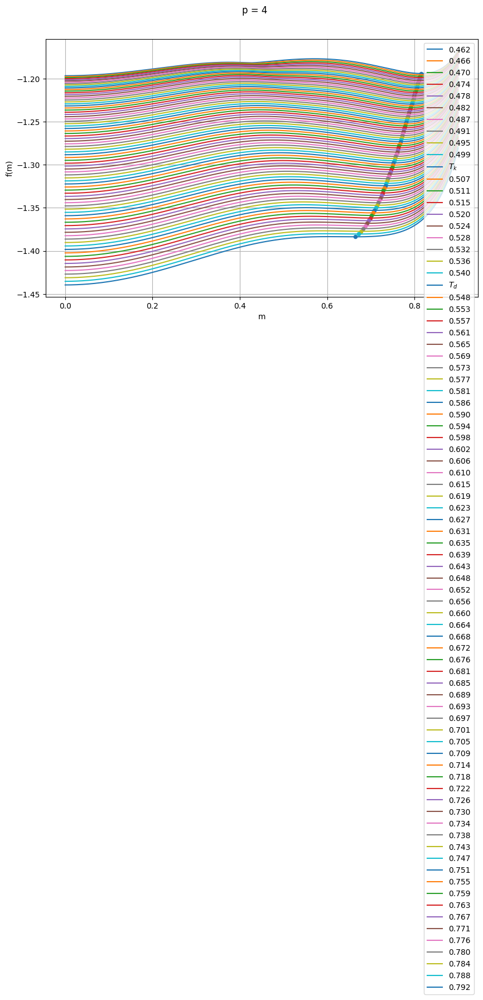

In [57]:
plt.figure(figsize=(10,6))
plt.suptitle(f"p = {p:d}")
for i, T in enumerate(Teqs):
    legend_name = routines.legend_name_Tk_Td_T(T, T_kauz, T_dyn)
    #legend_name = f'T = {Teqs[i]:.3f}'

    #plt.plot(ms, s_anneald[i], ':', color=f'C{i}')
    plt.plot(ms, data['f'][i], label=legend_name, color=f'C{i}')
    plt.scatter(mss[i], fss[i], c=f'C{i}', s=20)


plt.xlabel('m')
plt.ylabel(r'f(m)')
#plt.xlim(0, 0.8)
#plt.ylim(-1.4, -1.2)
plt.legend()
plt.grid()


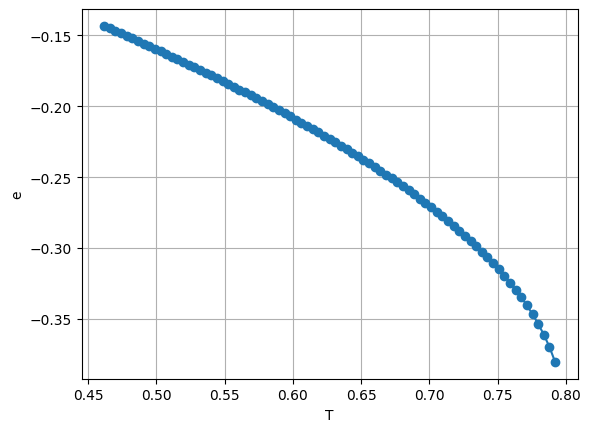

In [58]:
plt.plot(Teqs, ess, 'o-', label='FP')
plt.xlabel('T')
plt.ylabel('e')
plt.grid()

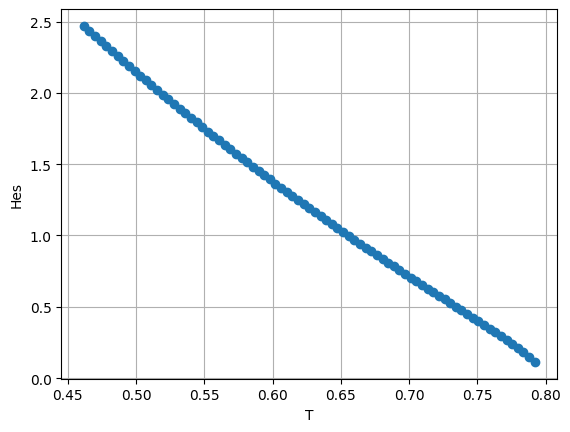

In [59]:
plt.plot(Teqs, Hes, 'o-', label='FP')
plt.xlabel('T')
plt.ylabel('Hes')
plt.grid()
#plt.xscale('log')
#plt.yscale('log')
#plt.axhline(y= 0.5 / T_kauz, color='k', linestyle='--')
#plt.axhline(y= 0, color='k', linestyle=':')

In [62]:
popt, pcov = curve_fit(linear, Teqs, Hes)

popt

array([-6.981928  ,  5.60853078])

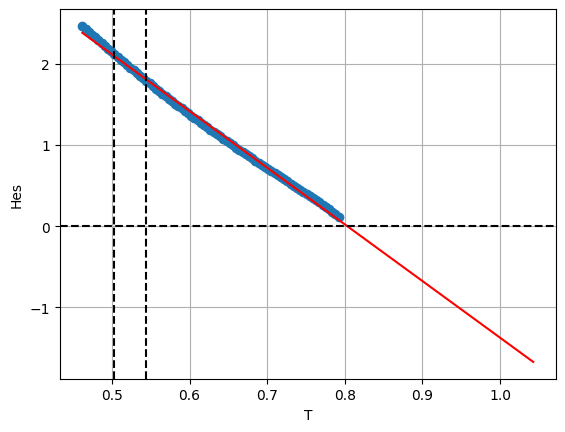

In [63]:
#plot the fitted curve and the originaldata
Tfit = np.linspace(Teqs[0], Teqs[-1] + 0.2* (Teqs[0] + Teqs[-1]), 100)
plt.plot(Teqs, Hes, 'o-', label='FP')
plt.plot(Tfit, linear(Tfit, *popt), 'r-', label='fit: a=%5.3f, b=%5.3f' % tuple(popt))
plt.axhline(y=0, color='k', linestyle='--')
plt.axvline(x=T_kauz, color='k', linestyle='--')
plt.axvline(x=T_dyn, color='k', linestyle='--')
plt.xlabel('T')
plt.ylabel('Hes')
plt.grid()
#plt.xscale('log')
#plt.yscale('log')